In [1]:
import os
import re
import sys
import pickle
import matplotlib as mpl
import matplotlib.pyplot as plt

from astropy.table import Table, vstack

sys.path.append('/Users/adamboesky/Research/long_transients')

from Source_Analysis.Sources import Sources, Source
from Source_Analysis.filter_fields import *
from Extracting.utils import get_n_quadrants_merged, get_n_quadrants_merged_all_fields, load_ecsv, get_snr_from_mag, img_ab_mag_to_flux, img_flux_to_ab_mag

# Plot formatting
plt.rc('text', usetex=True)
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = 'cmr10'  # Computer Modern Roman
mpl.rcParams['font.size'] = 12  # Adjust the font size as needed
mpl.rcParams['axes.formatter.use_mathtext'] = True

CasJobs will use the credentials from mast_login_harvard.txt


/Users/adamboesky/opt/anaconda3/envs/long_transients/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
g_tab = load_ecsv('/Users/adamboesky/Research/long_transients/Data/filter_results/000791/2_g_test.ecsv')
g_tab

ra,dec,ZTF_thresh,ZTF_npix,ZTF_tnpix,ZTF_xmin,ZTF_xmax,ZTF_ymin,ZTF_ymax,ZTF_x,ZTF_y,ZTF_x2,ZTF_y2,ZTF_xy,ZTF_errx2,ZTF_erry2,ZTF_errxy,ZTF_a,ZTF_b,ZTF_theta,ZTF_cxx,ZTF_cyy,ZTF_cxy,ZTF_cflux,ZTF_flux,ZTF_cpeak,ZTF_peak,ZTF_xcpeak,ZTF_ycpeak,ZTF_xpeak,ZTF_ypeak,ZTF_sepExtractionFlag,ZTF_KronRad,ZTF_gKronMag,ZTF_gKronMagErr,ZTF_gKronCircleFlag,ZTF_gKronFlag,ZTF_gPSFMag,ZTF_gPSFMagErr,ZTF_gPSFFlags,ZTF_qfit,ZTF_cfit,ZTF_g_zero_pt_mag,ZTF_g_mag_limit,ZTF_ra,ZTF_dec,PSTARR_PanSTARR_ID,PSTARR_qualityFlag,PSTARR_objInfoFlag,PSTARR_gKronMag,PSTARR_gKronMagErr,PSTARR_gPSFMag,PSTARR_gPSFMagErr,PSTARR_gpsfLikelihood,PSTARR_ginfoFlag,PSTARR_ginfoFlag2,PSTARR_rKronMag,PSTARR_rKronMagErr,PSTARR_rPSFMag,PSTARR_rPSFMagErr,PSTARR_rpsfLikelihood,PSTARR_rinfoFlag,PSTARR_rinfoFlag2,PSTARR_iKronMag,PSTARR_iKronMagErr,PSTARR_iPSFMag,PSTARR_iPSFMagErr,PSTARR_ipsfLikelihood,PSTARR_iinfoFlag,PSTARR_iinfoFlag2,PSTARR_ra,PSTARR_dec,association_separation_arcsec,Catalog,Catalog_Flag,x,y,fieldid,ccdid,qid,ZTF_g_upper_lim_flag
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,float64,float64,float64,object,object,object,object
197.39104838,51.98472019,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,23.88,nan,nan,170381973910502344,16.0,135790592.0,21.1208000183105,0.0458079986274242,20.6657009124756,0.0161949992179871,0.0,262160391.0,524416.0,nan,nan,nan,nan,nan,nan,nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,197.39104838,51.98472019,nan,PSTARR,2.0,2020.0,3104.0,000791,04,2,False
197.07595505,52.00898511,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,23.88,nan,nan,170411970759531462,48.0,404226048.0,20.9846000671387,0.0463539995253086,20.7052001953125,0.0206199996173382,0.0,262160391.0,524416.0,nan,nan,22.9386005401611,0.183098003268242,0.0,35667973.0,4726912.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,197.07595505,52.00898511,nan,PSTARR,2.0,1330.0,2967.0,000791,04,2,False
197.293398023087,52.0097451113785,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,23.88,nan,nan,170411972933782399,52.0,436363264.0,22.136100769043,0.0798280015587807,21.9993991851807,0.0536679998040199,-0.894003987312317,35651585.0,0.0,21.7234992980957,0.0577300004661083,21.4326992034912,0.0343919992446899,0.0129719004034996,102760453.0,128.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,197.293398023087,52.0097451113785,nan,PSTARR,2.0,1811.0,2999.0,000791,04,2,False
197.022285038682,52.0213715455617,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,23.88,nan,nan,170421970223656388,52.0,436527104.0,nan,nan,21.4118995666504,0.0457290001213551,7.9283897299386e-24,253771783.0,4849792.0,nan,nan,20.9451007843018,0.0266609992831945,0.0,253771783.0,4718720.0,20.8027992248535,0.0355000011622906,20.8631000518799,0.024422999471426,6.16073987266991e-19,262160391.0,524416.0,197.022285038682,52.0213715455617,nan,PSTARR,2.0,1214.0,2914.0,000791,04,2,False
197.29312307,52.03580387,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,23.88,nan,nan,1704

In [3]:
srcs = Sources(
    ras=g_tab['ra'],
    decs=g_tab['dec'],
    field_catalogs={'g': g_tab},
)

197.39104838 51.98472019
Searching for source in the catalogs!
Searching g catalog for source...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=04+AND+qid=2

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpmddu59nf/ztf_000791_zi_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmph7t2q3t4/ztf_000791_zg_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpjfhgyfkj/ztf_000791_zr_c04_q2_refimg.fits


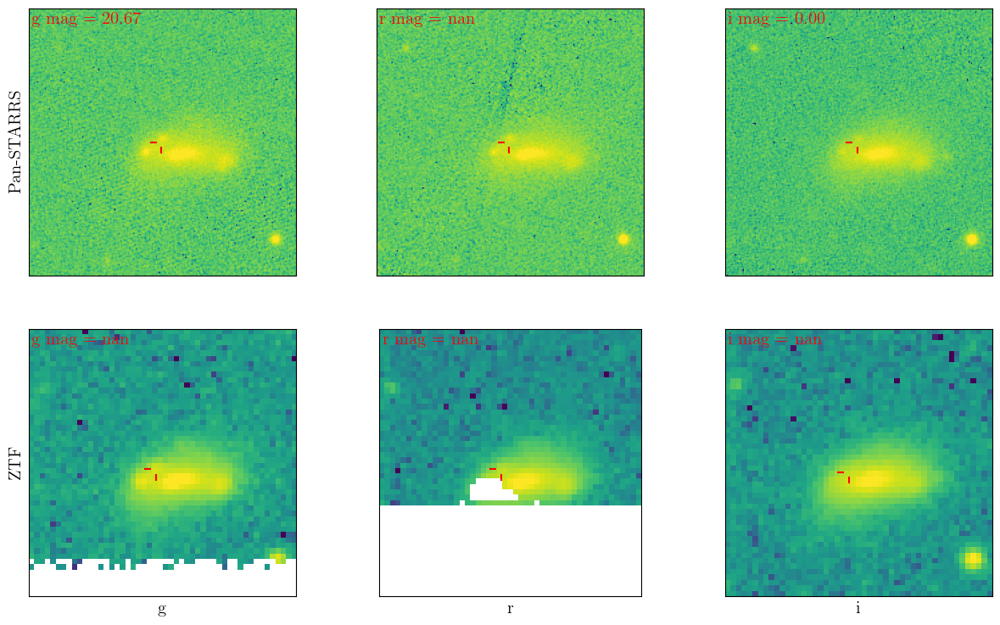

197.07595505 52.00898511
Searching for source in the catalogs!
Searching g catalog for source...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=04+AND+qid=2

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp2c6u_k73/ztf_000791_zi_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp10ftdvn5/ztf_000791_zg_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp3ldp3_t9/ztf_000791_zr_c04_q2_refimg.fits


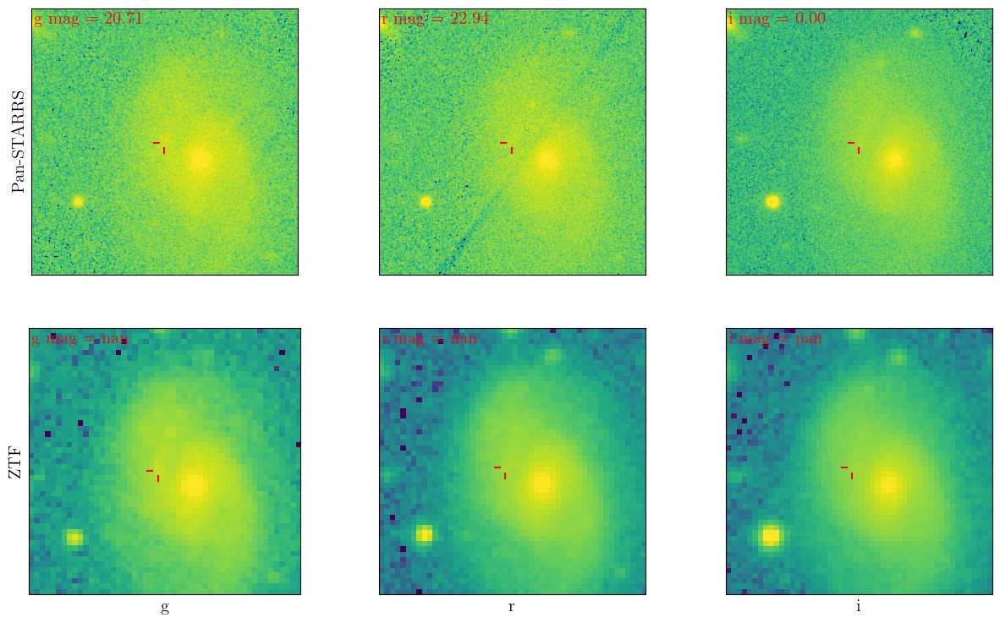

197.293398023087 52.0097451113785
Searching for source in the catalogs!
Searching g catalog for source...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=04+AND+qid=2

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpwjp_aa5w/ztf_000791_zi_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmphq9gqnvc/ztf_000791_zg_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp7me_qox6/ztf_000791_zr_c04_q2_refimg.fits


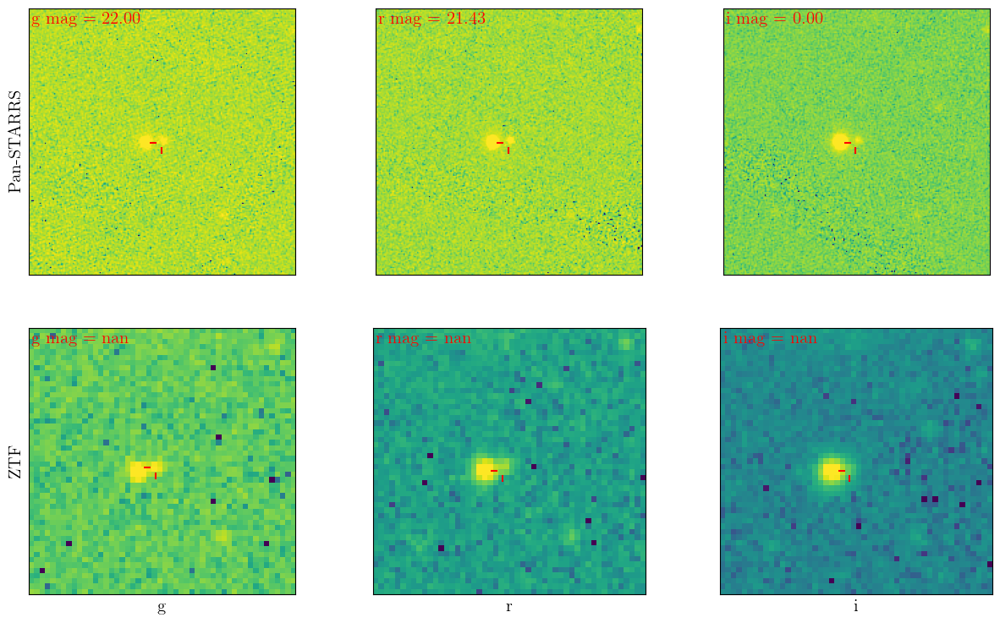

197.022285038682 52.0213715455617
Searching for source in the catalogs!
Searching g catalog for source...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=04+AND+qid=2

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpjyucocpc/ztf_000791_zi_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp50ejff3e/ztf_000791_zg_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmph8litbkz/ztf_000791_zr_c04_q2_refimg.fits


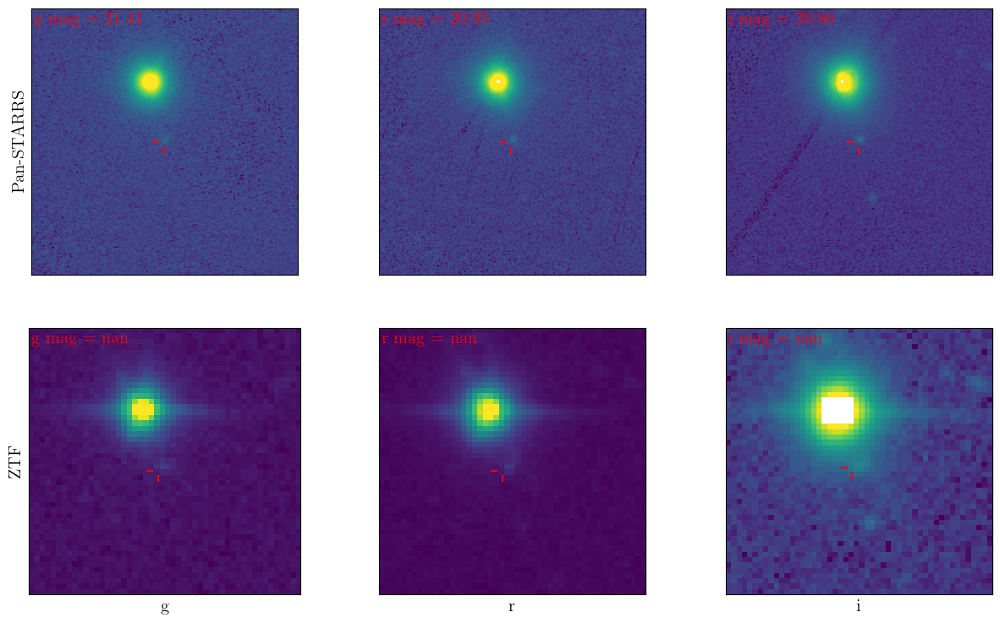

197.29312307 52.03580387
Searching for source in the catalogs!
Searching g catalog for source...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=04+AND+qid=2

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpakt74oyv/ztf_000791_zr_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzrs7vlv7/ztf_000791_zg_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpbnsp5yqd/ztf_000791_zi_c04_q2_refimg.fits


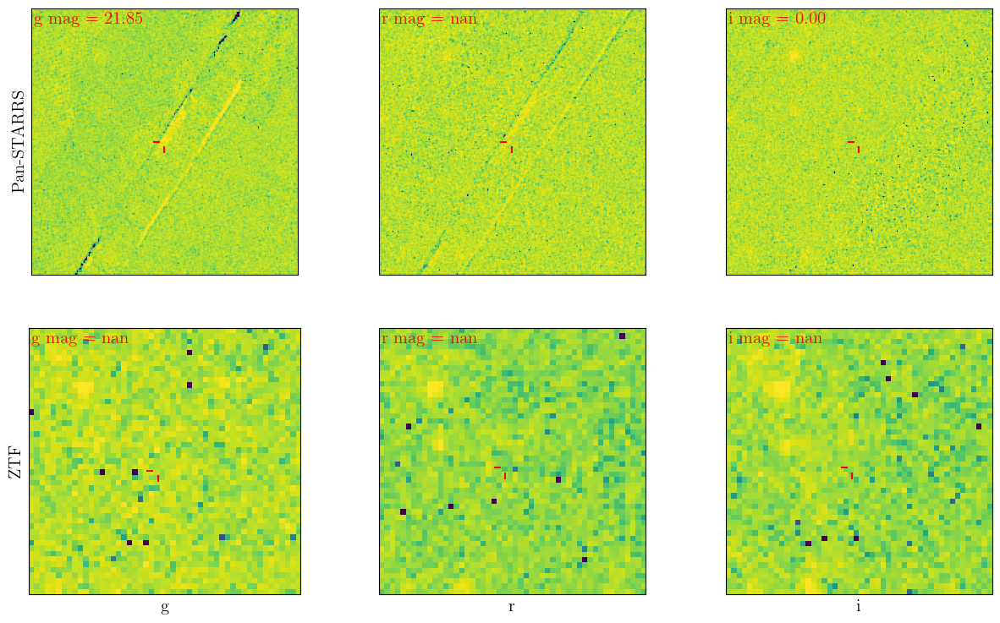

197.150061850217 52.0861994894211
Searching for source in the catalogs!
Searching g catalog for source...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=04+AND+qid=2

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpox1pgvhq/ztf_000791_zg_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzjowqdec/ztf_000791_zr_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpkno73gy5/ztf_000791_zi_c04_q2_refimg.fits


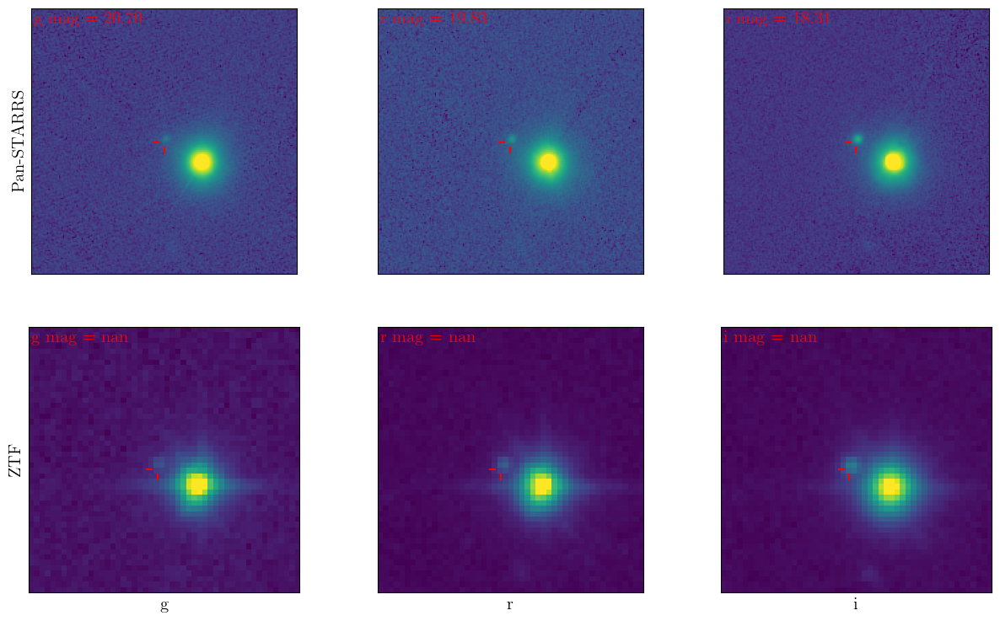

196.866825216567 52.1010504734815
Searching for source in the catalogs!
Searching g catalog for source...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=04+AND+qid=2
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpt9tkyq2m/ztf_000791_zi_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpw2qiqlle/ztf_000791_zg_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpbsvts1xq/ztf_000791_zr_c04_q2_refimg.fits


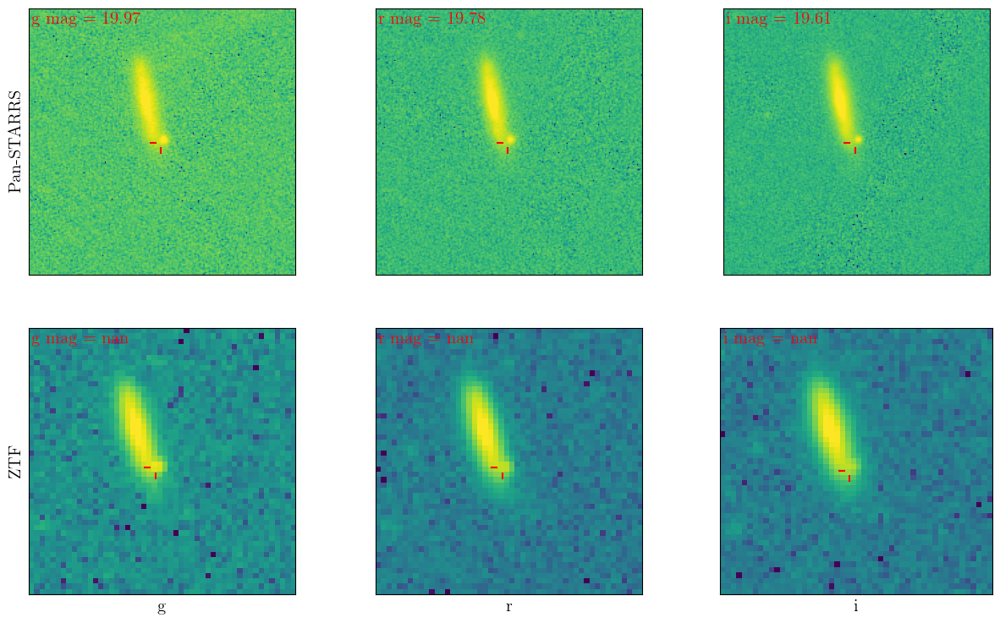

197.39954653 52.14835297
Searching for source in the catalogs!
Searching g catalog for source...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=04+AND+qid=2

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzh30c8hy/ztf_000791_zi_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpevo6lxfe/ztf_000791_zr_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp9yl_2q91/ztf_000791_zg_c04_q2_refimg.fits


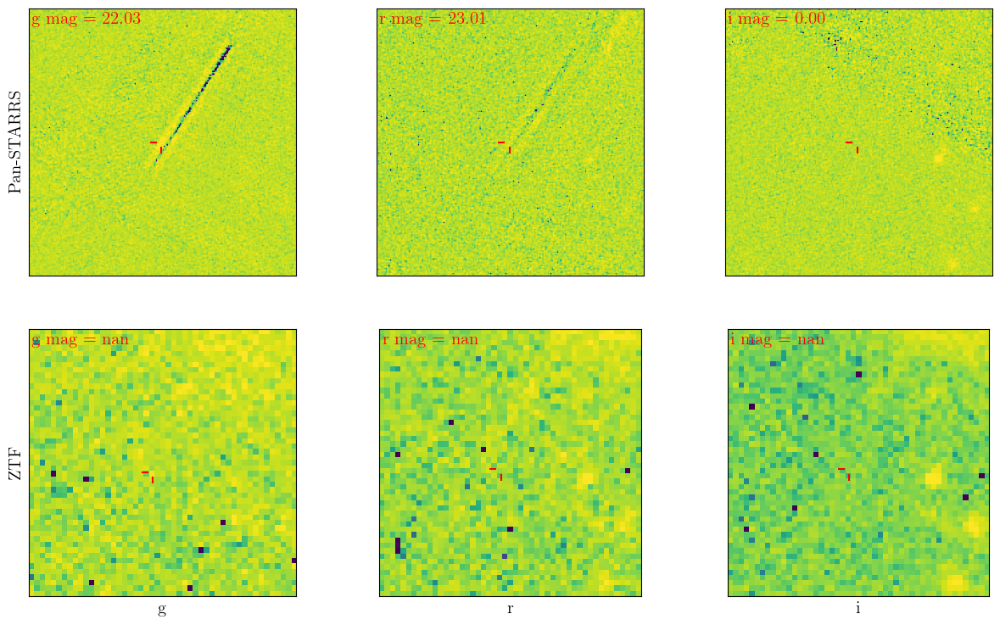

197.38666982 52.16036861
Searching for source in the catalogs!
Searching g catalog for source...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=04+AND+qid=2

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpj38yeqni/ztf_000791_zg_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpf7r0lb8n/ztf_000791_zr_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpespoo9ga/ztf_000791_zi_c04_q2_refimg.fits


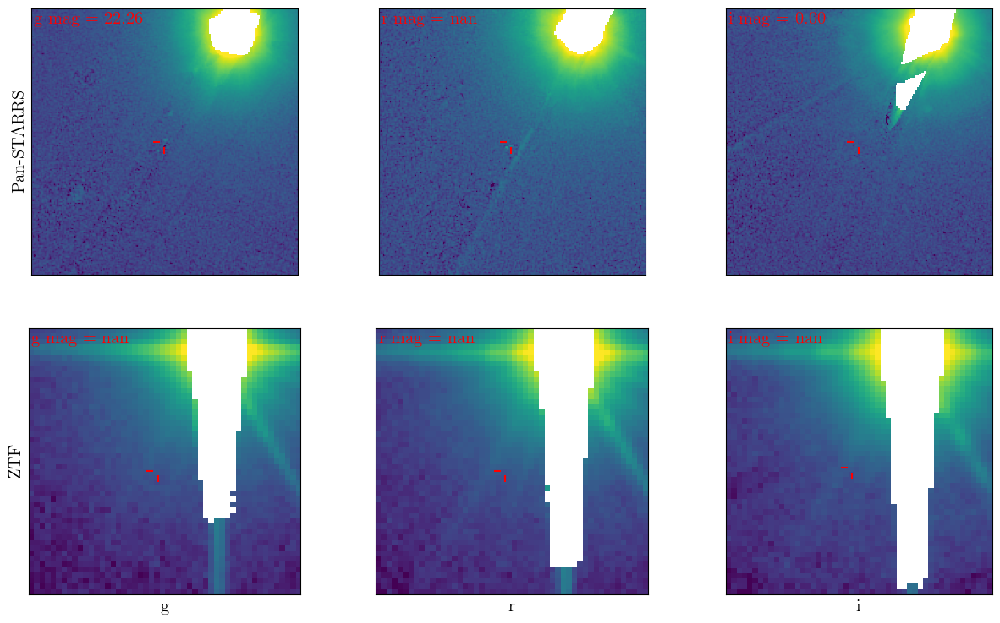

197.37595562 52.17039189
Searching for source in the catalogs!
Searching g catalog for source...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=04+AND+qid=2

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpkmovoslb/ztf_000791_zg_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpx3sjr0w0/ztf_000791_zi_c04_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmporbfln03/ztf_000791_zr_c04_q2_refimg.fits


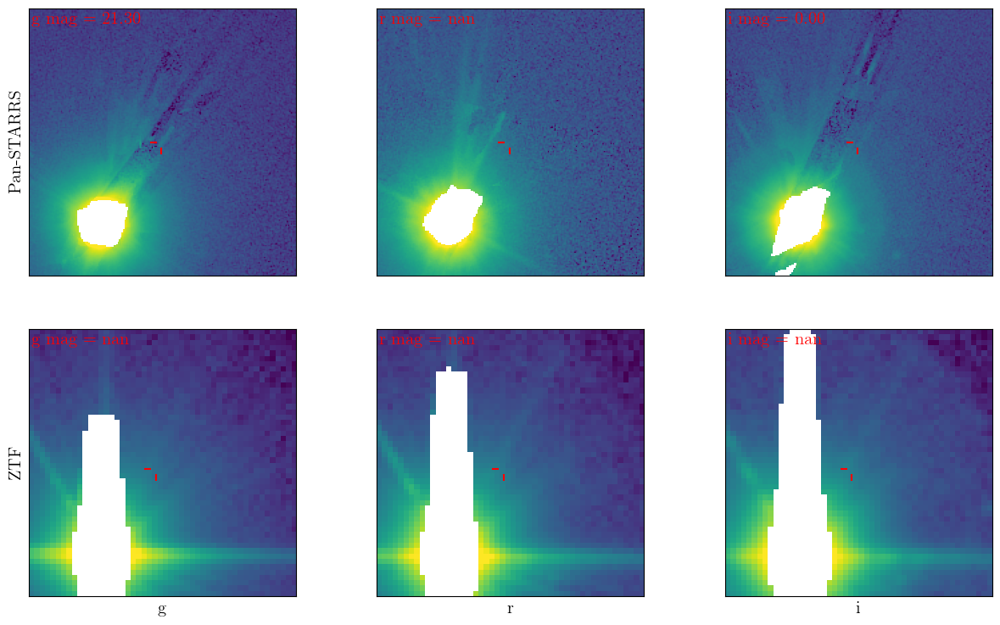

In [4]:
for src in srcs[:10]:
    print(src.ra, src.dec)
    src.plot_all_cutouts()
    plt.show()

In [12]:
srcs[9].data

ra,dec,PSTARR_ginfoFlag,PSTARR_ipsfLikelihood,PSTARR_qualityFlag,PSTARR_ginfoFlag2,PSTARR_rKronMagErr,PSTARR_ra,PSTARR_iKronMag,PSTARR_objInfoFlag,PSTARR_gKronMagErr,PSTARR_rinfoFlag,PSTARR_iPSFMagErr,PSTARR_iKronMagErr,PSTARR_rPSFMag,PSTARR_gpsfLikelihood,PSTARR_rKronMag,PSTARR_gPSFMagErr,PSTARR_iinfoFlag2,PSTARR_PanSTARR_ID,PSTARR_iinfoFlag,PSTARR_gKronMag,PSTARR_rpsfLikelihood,PSTARR_rinfoFlag2,PSTARR_gPSFMag,PSTARR_rPSFMagErr,PSTARR_dec,PSTARR_iPSFMag,PSTARR_primaryDetection,ZTF_g_y2,ZTF_KronRad,ZTF_i_ymin,ZTF_r_xmax,ZTF_r_peak,ZTF_g_sepExtractionFlag,ZTF_iKronCircleFlag,ZTF_r_xcpeak,ZTF_g_field,ZTF_g_thresh,ZTF_gPSFMag,ZTF_g_upper_lim_flag,ZTF_i_zero_pt_mag,ZTF_i_cxx,ZTF_i_qid,ZTF_i_xmax,ZTF_r_ymax,ZTF_r_x2,ZTF_iKronMagErr,ZTF_i_erry2,ZTF_i_ypeak,ZTF_r_tnpix,ZTF_r_cxy,ZTF_i_sepExtractionFlag,ZTF_i_thresh,ZTF_i_xy,ZTF_gKronCircleFlag,ZTF_r_y2,ZTF_g_ymax,ZTF_gKronMagErr,ZTF_r_ccdid,ZTF_r_a,ZTF_i_ra,ZTF_r_zero_pt_mag,ZTF_r_ypeak,ZTF_i_errx2,ZTF_g_a,ZTF_r_field,ZTF_i_tnpix,ZTF_g_npix,ZTF_g_ccdid,ZTF_iPSFMag,ZTF_i_mag_limit,ZTF_gKronFlag,ZTF_r_ra,ZTF_r_cpeak,ZTF_gPSFFlags,ZTF_r_cxx,ZTF_r_xmin,ZTF_g_ymin,ZTF_r_qid,ZTF_r_mag_limit,ZTF_g_x,ZTF_i_cpeak,ZTF_iKronFlag,ZTF_rKronFlag,ZTF_i_xmin,ZTF_g_flux,ZTF_r_qfit,ZTF_g_cxx,ZTF_g_dec,ZTF_g_xmax,ZTF_g_qfit,ZTF_rPSFMagErr,ZTF_i_cyy,ZTF_i_y2,ZTF_i_y,ZTF_gPSFMagErr,ZTF_r_x,ZTF_g_ycpeak,ZTF_g_xpeak,ZTF_i_ycpeak,ZTF_rKronCircleFlag,ZTF_rPSFMag,ZTF_i_x2,ZTF_r_y,ZTF_i_npix,ZTF_g_tnpix,ZTF_r_dec,ZTF_i_a,ZTF_i_peak,ZTF_g_qid,ZTF_r_sepExtractionFlag,ZTF_i_dec,ZTF_r_ymin,ZTF_i_xpeak,ZTF_i_qfit,ZTF_i_cfit,ZTF_r_erry2,ZTF_r_thresh,ZTF_i_ymax,ZTF_i_upper_lim_flag,ZTF_i_errxy,ZTF_g_errx2,ZTF_i_x,ZTF_g_erry2,ZTF_g_ypeak,ZTF_iKronMag,ZTF_rKronMagErr,ZTF_i_cxy,ZTF_r_xy,ZTF_g_cxy,ZTF_i_ccdid,ZTF_r_cflux,ZTF_g_mag_limit,ZTF_r_cfit,ZTF_r_cyy,ZTF_g_theta,ZTF_iPSFMagErr,ZTF_i_flux,ZTF_g_cfit,ZTF_g_x2,ZTF_i_b,ZTF_rPSFFlags,ZTF_r_errxy,ZTF_iPSFFlags,ZTF_i_cflux,ZTF_r_b,ZTF_g_zero_pt_mag,ZTF_i_xcpeak,ZTF_g_cyy,ZTF_r_xpeak,ZTF_g_xy,ZTF_r_ycpeak,ZTF_r_flux,ZTF_g_cpeak,ZTF_g_cflux,ZTF_g_xmin,ZTF_g_b,ZTF_r_upper_lim_flag,ZTF_g_y,ZTF_i_theta,ZTF_g_peak,ZTF_rKronMag,ZTF_g_ra,ZTF_i_field,ZTF_g_xcpeak,ZTF_r_errx2,ZTF_r_npix,ZTF_gKronMag,ZTF_r_theta,ZTF_g_errxy,qid,fieldid,x,Catalog_Flag,Catalog,ccdid,association_separation_arcsec,filter_info,y
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bytes10,float64,float64,float64,float64
197.37595562,52.17039189,262160391.0,0.0,96.0,524416.0,nan,197.37595562,0.0,806879232.0,0.0898149982094765,nan,0.0,0.0,nan,0.0,nan,0.0376849994063377,0.0,1.7060197375954515e+17,0.0,21.2800006866455,nan,nan,21.3029003143311,nan,52.17039189,0.0,nan,nan,nan,nan,nan,nan

In [ ]:
from Source_Analysis.filter_fields import _is_flag
for i in range(23):
    if _is_flag(np.array([52]), 2**i):
        print(2**i)

# Checking new flags

In [22]:
test_mask = ~np.logical_or(
    _is_flag(g_tab['PSTARR_qualityFlag'], [1, 2, 128]),
    _is_flag(g_tab['PSTARR_objInfoFlag'], [8388608, 16777216, 1073741824]),
)
g_tab_test = g_tab[test_mask]
g_tab_test

ra,dec,ZTF_thresh,ZTF_npix,ZTF_tnpix,ZTF_xmin,ZTF_xmax,ZTF_ymin,ZTF_ymax,ZTF_x,ZTF_y,ZTF_x2,ZTF_y2,ZTF_xy,ZTF_errx2,ZTF_erry2,ZTF_errxy,ZTF_a,ZTF_b,ZTF_theta,ZTF_cxx,ZTF_cyy,ZTF_cxy,ZTF_cflux,ZTF_flux,ZTF_cpeak,ZTF_peak,ZTF_xcpeak,ZTF_ycpeak,ZTF_xpeak,ZTF_ypeak,ZTF_sepExtractionFlag,ZTF_KronRad,ZTF_gKronMag,ZTF_gKronMagErr,ZTF_gKronCircleFlag,ZTF_gKronFlag,ZTF_gPSFMag,ZTF_gPSFMagErr,ZTF_gPSFFlags,ZTF_qfit,ZTF_cfit,ZTF_g_zero_pt_mag,ZTF_g_mag_limit,ZTF_ra,ZTF_dec,PSTARR_PanSTARR_ID,PSTARR_qualityFlag,PSTARR_objInfoFlag,PSTARR_gKronMag,PSTARR_gKronMagErr,PSTARR_gPSFMag,PSTARR_gPSFMagErr,PSTARR_gpsfLikelihood,PSTARR_ginfoFlag,PSTARR_ginfoFlag2,PSTARR_rKronMag,PSTARR_rKronMagErr,PSTARR_rPSFMag,PSTARR_rPSFMagErr,PSTARR_rpsfLikelihood,PSTARR_rinfoFlag,PSTARR_rinfoFlag2,PSTARR_iKronMag,PSTARR_iKronMagErr,PSTARR_iPSFMag,PSTARR_iPSFMagErr,PSTARR_ipsfLikelihood,PSTARR_iinfoFlag,PSTARR_iinfoFlag2,PSTARR_ra,PSTARR_dec,association_separation_arcsec,Catalog,Catalog_Flag,x,y,fieldid,ccdid,qid,ZTF_g_upper_lim_flag
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,float64,float64,float64,object,object,object,object
208.03940299097,51.9476588189127,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,23.93,nan,nan,170332080395417857,52.0,436527104.0,22.1856002807617,0.0987299978733063,22.0524997711182,0.0629020035266876,0.00697381002828479,35651585.0,0.0,21.996000289917,0.0938910022377968,21.9361000061035,0.0613619983196259,0.346091002225876,35651585.0,0.0,21.9043006896973,0.0891579985618591,21.7618999481201,0.0554159991443157,0.422794997692108,35651585.0,0.0,208.03940299097,51.9476588189127,nan,PSTARR,2.0,2463.0,3113.0,000791,01,1,False
208.11535134,51.98501594,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,23.93,nan,nan,170382081155812694,52.0,436285440.0,nan,nan,22.0510997772217,0.0587369985878468,-1.54330996827119e-27,35653633.0,0.0,nan,nan,22.92919921875,0.16975599527359,-1.17609004132713e-11,35651585.0,0.0,nan,nan,nan,nan,nan,nan,nan,208.11535134,51.98501594,nan,PSTARR,2.0,2620.0,2965.0,000791,01,1,False
207.51569931,52.00640597,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,23.93,nan,nan,170402075157798388,52.0,436285440.0,21.710599899292,0.0770940035581589,22.217399597168,0.0706150010228157,4.00481013684839e-07,35667969.0,0.0,nan,nan,nan,nan,nan,nan,nan,21.8509998321533,0.105927996337414,21.9218997955322,0.0702299997210503,0.0133597003296018,35651585.0,0.0,207.51569931,52.00640597,nan,PSTARR,2.0,1288.0,2994.0,000791,01,1,False
207.851527761565,52.0055123760891,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,23.93,nan,nan,170402078516197301,52.0,436527104.0,19.7049999237061,0.0117669999599457,19.4636993408203,0.00827500037848949,1.28545000097307e-14,262160391.0,524416.0,18.7744998931885,0.005129000172019,18.638599395752,0.00438799988478422,1.18136002282693e-12,262160391.0,524416.0,18.4377994537354,0.0035119999665767,18.3414993286133,0.00295699993148446,0.00010481099889148,262160391.0,524416.0,207.851527761565,52.0055123760891,nan,PSTARR,2.0,2031.0,2939.0,0

In [23]:
srcs_test = Sources(
    ras=g_tab_test['ra'],
    decs=g_tab_test['dec'],
    field_catalogs={'g': g_tab_test},
)

208.03940299097 51.9476588189127
Searching for source in the catalogs!
Searching g catalog for source...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=01+AND+qid=1

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpz_fykba3/ztf_000791_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpxpsxbzu0/ztf_000791_zr_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp5ygy6fha/ztf_000791_zi_c01_q1_refimg.fits


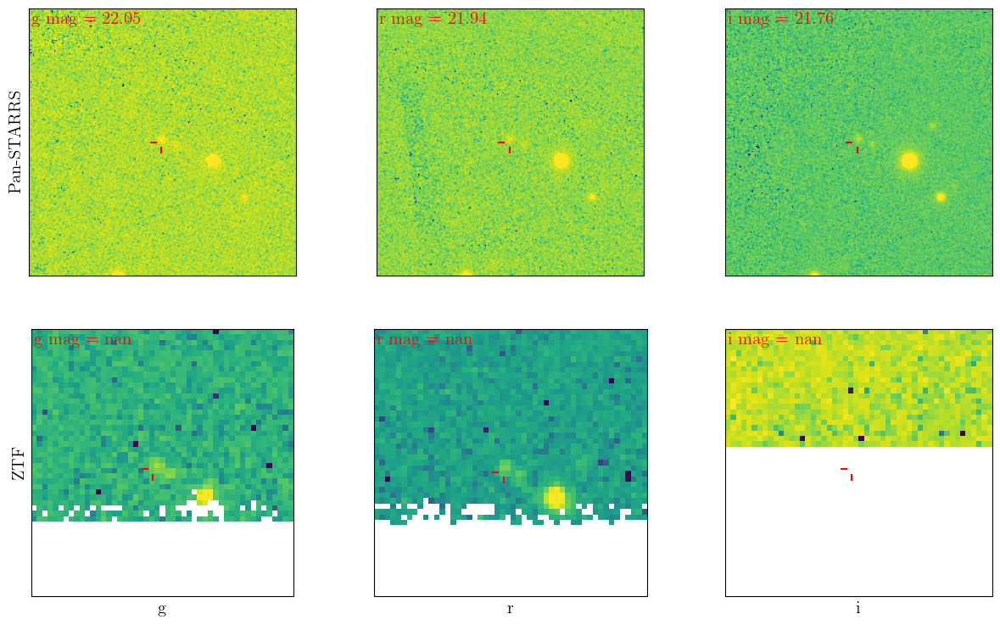

208.11535134 51.98501594
Searching for source in the catalogs!
Searching g catalog for source...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=01+AND+qid=1

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpl5s574z3/ztf_000791_zr_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp016anv2m/ztf_000791_zi_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmph0rko9af/ztf_000791_zg_c01_q1_refimg.fits


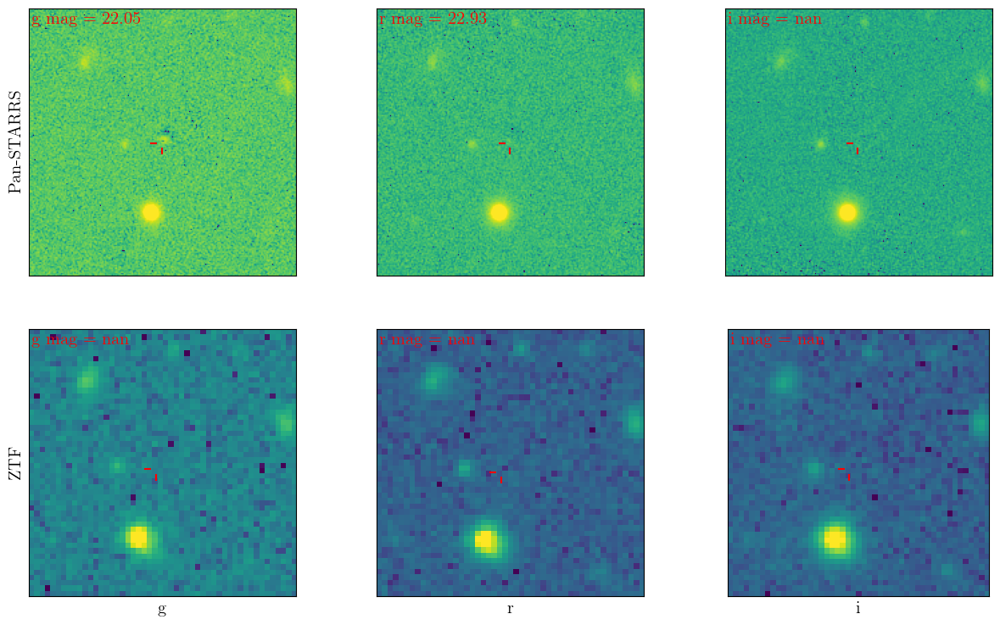

207.51569931 52.00640597
Searching for source in the catalogs!
Searching g catalog for source...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=01+AND+qid=1

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmphbnlhkid/ztf_000791_zi_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpmak6lxoy/ztf_000791_zr_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpgqs5zf5m/ztf_000791_zg_c01_q1_refimg.fits


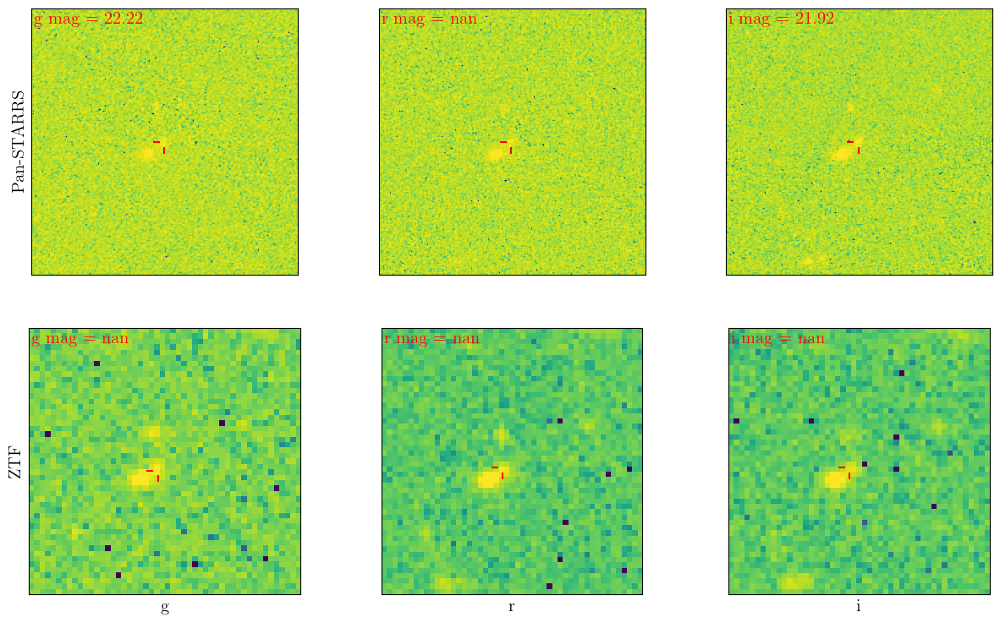

207.851527761565 52.0055123760891
Searching for source in the catalogs!
Searching g catalog for source...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=01+AND+qid=1

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzv3oy8fd/ztf_000791_zr_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpbb8k9hob/ztf_000791_zi_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpt_ile3l5/ztf_000791_zg_c01_q1_refimg.fits


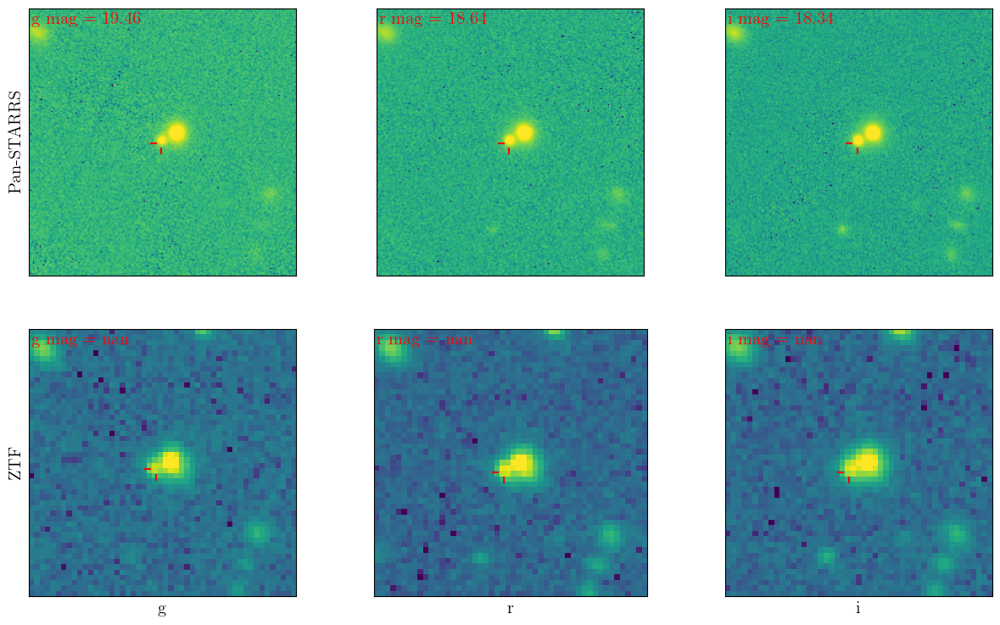

208.10754826 52.02765339
Searching for source in the catalogs!
Searching g catalog for source...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=01+AND+qid=1

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpgjjzlvqp/ztf_000791_zr_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpgxh7i5gv/ztf_000791_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpv1keb8vp/ztf_000791_zi_c01_q1_refimg.fits


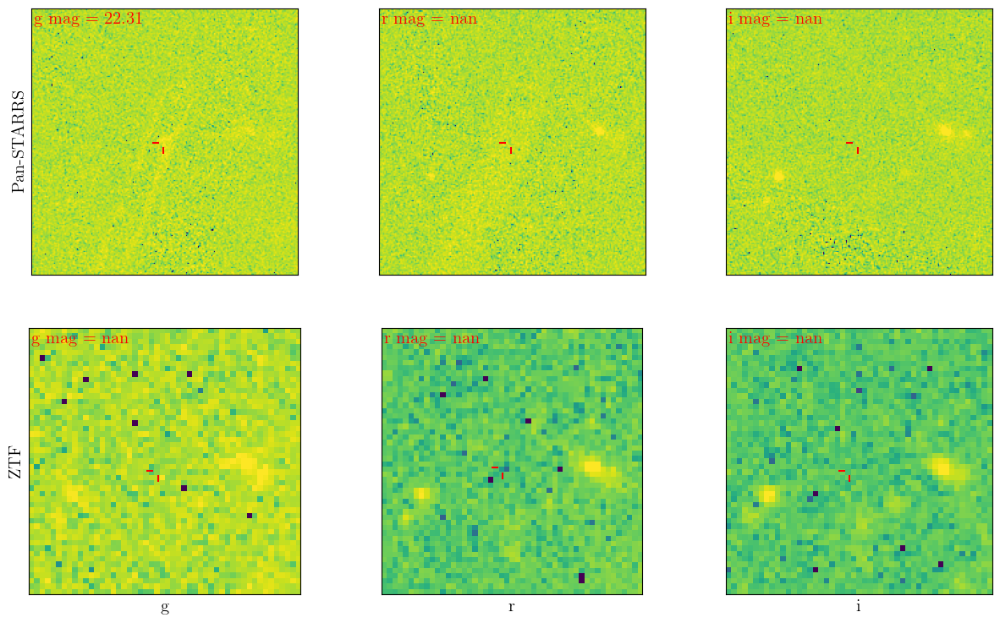

207.335992638165 52.0600251937924
Searching for source in the catalogs!
Searching g catalog for source...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp3s3ggj2p/ztf_000791_zi_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp25i9zvyn/ztf_000791_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp5phe_zgj/ztf_000791_zr_c01_q1_refimg.fits


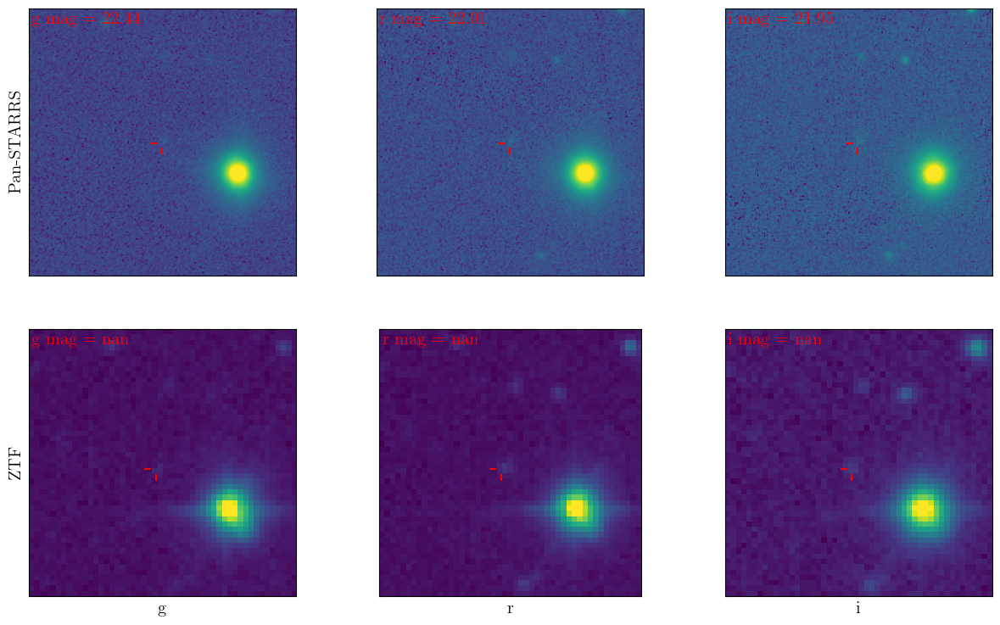

208.158255177533 52.0720026737858
Searching for source in the catalogs!
Searching g catalog for source...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=01+AND+qid=1

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp5c5zjqal/ztf_000791_zr_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpymbflq21/ztf_000791_zi_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpvrxuvd8i/ztf_000791_zg_c01_q1_refimg.fits


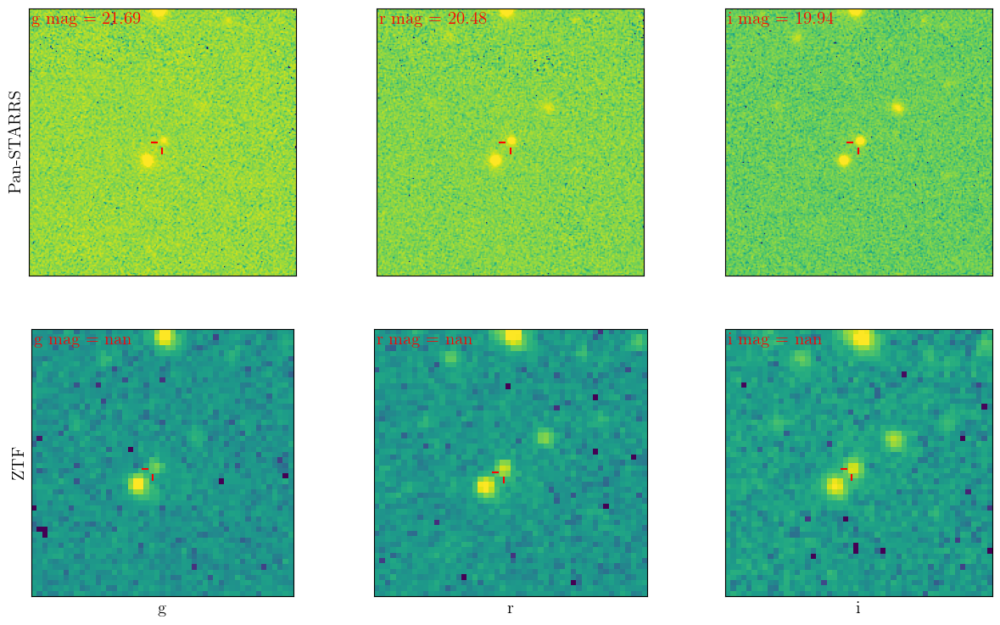

208.322439209154 52.0782506483989
Searching for source in the catalogs!
Searching g catalog for source...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=01+AND+qid=1

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpw39sf8px/ztf_000791_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpa6jghr7v/ztf_000791_zi_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp1vik3u3u/ztf_000791_zr_c01_q1_refimg.fits


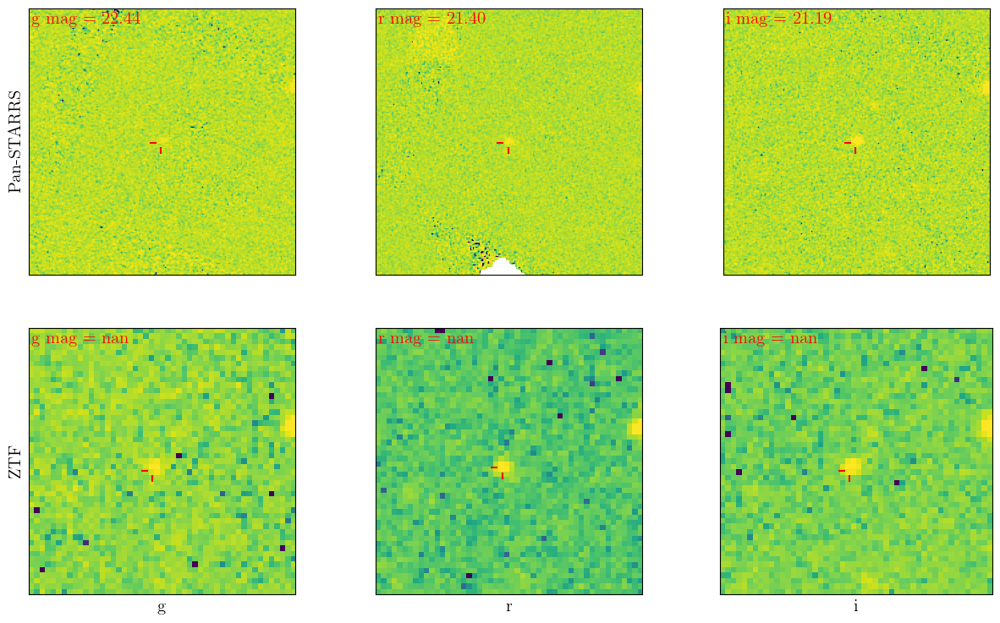

208.31471126825 52.0961443403602
Searching for source in the catalogs!
Searching g catalog for source...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=01+AND+qid=1

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpa6al7a4d/ztf_000791_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpprke4uko/ztf_000791_zr_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpbzaxgiu4/ztf_000791_zi_c01_q1_refimg.fits


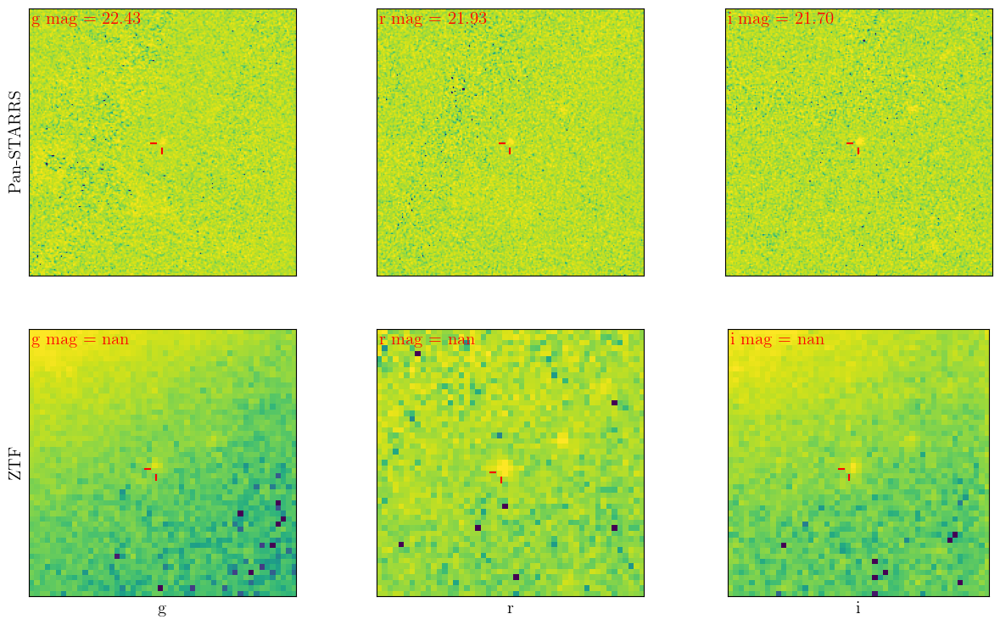

206.981417036627 52.1056782652323
Searching for source in the catalogs!
Searching g catalog for source...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000791+AND+ccdid=01+AND+qid=1

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpvnmkbj4o/ztf_000791_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpummgropi/ztf_000791_zi_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpr8q6vseu/ztf_000791_zr_c01_q1_refimg.fits


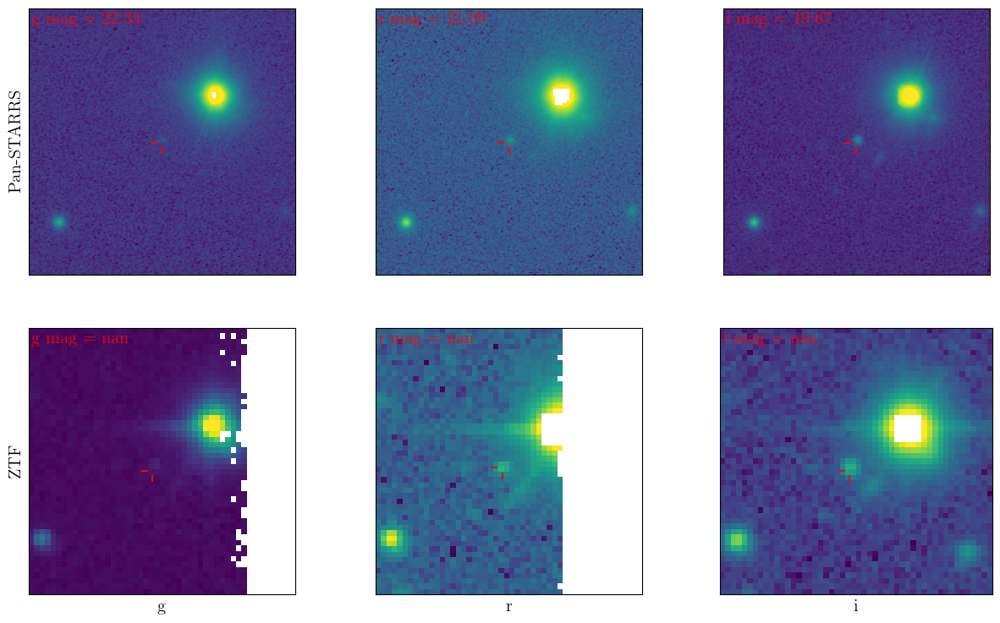

In [24]:
for src in srcs_test[:10]:
    print(src.ra, src.dec)
    src.plot_all_cutouts()
    plt.show()

In [40]:
full_tab = load_ecsv('/Users/adamboesky/Research/long_transients/Data/catalog_results/field_results/000791_i.ecsv')

In [83]:
from Extracting.Catalogs import ZTF_Catalog

print(srcs[8].image_metadata)
ztf_cat = ZTF_Catalog(
    ra=srcs[8].ra,
    dec=srcs[8].dec,
    band='g',
    image_metadata=srcs[8].image_metadata
)
ztf_cat.sextractor.deblend_cont = 0.00001

{'fieldid': 791, 'ccdid': 1, 'qid': 1}
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpmq5yw7od/ztf_000791_zg_c01_q1_refimg.fits


In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


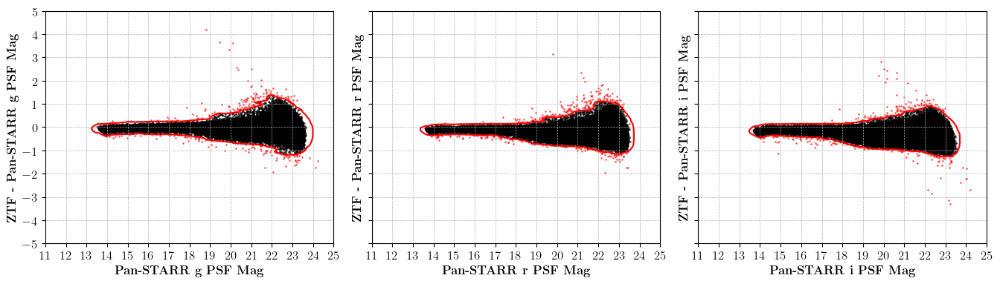

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

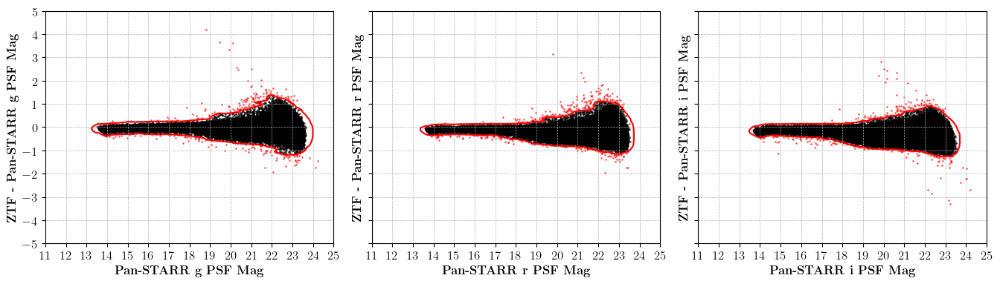

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

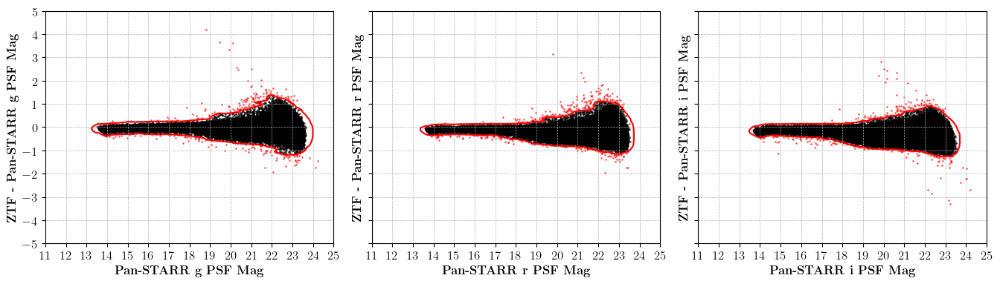

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


In [ ]:
xgrid = np.linspace(11, 25, 100)
ygrid = np.linspace(-5, 5, 100)
Zs = {}
kdes = {}
for band in ('g', 'r', 'i'):

    # Get the data
    print('Fetching data...')
    tab = tables[band]
    x = tab[f'PSTARR_{band}PSFMag']
    y = tab[f'ZTF_{band}PSFMag'] - tab[f'PSTARR_{band}PSFMag']

    # Create KDE object
    print('Calculating the KDE...')
    xy = np.vstack([x, y])
    kdes[band] = gaussian_kde(xy)

    # Evaluate KDE on grid
    X, Y = np.meshgrid(xgrid, ygrid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Zs[band] = np.reshape(kdes[band](positions).T, X.shape)

Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...
Fetching data...
Calculating the KDE...


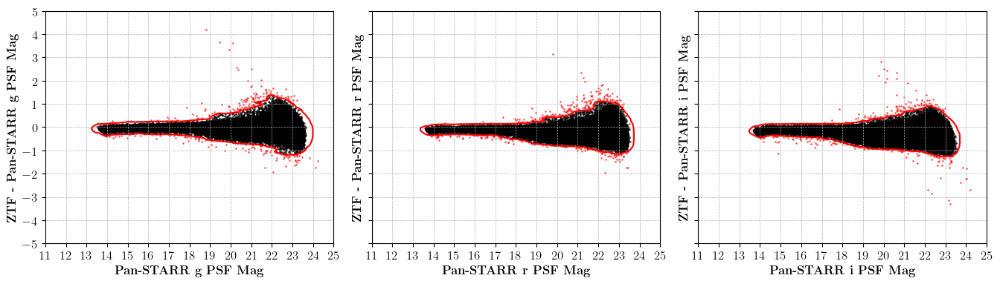

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

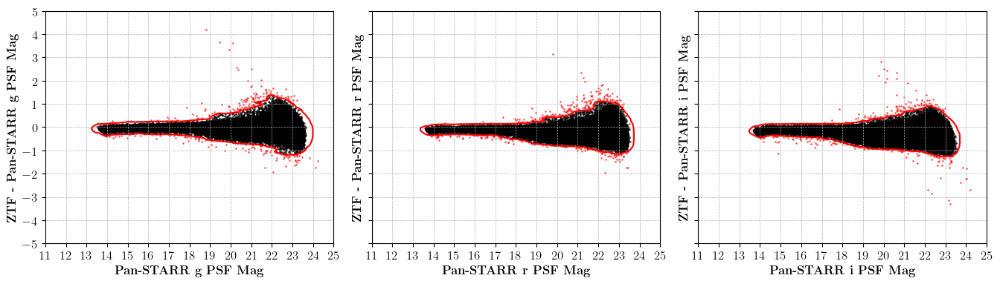

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

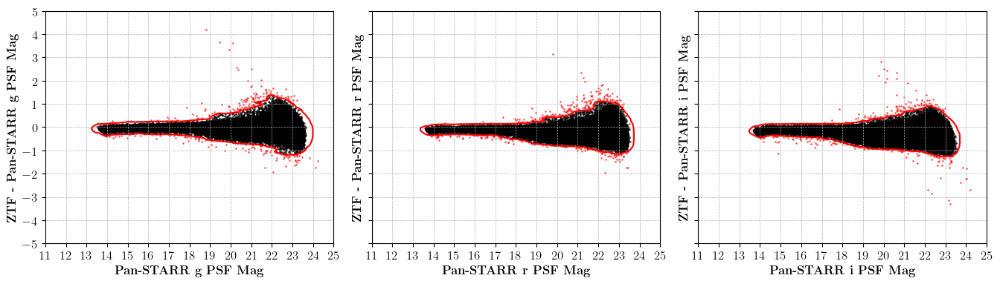

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

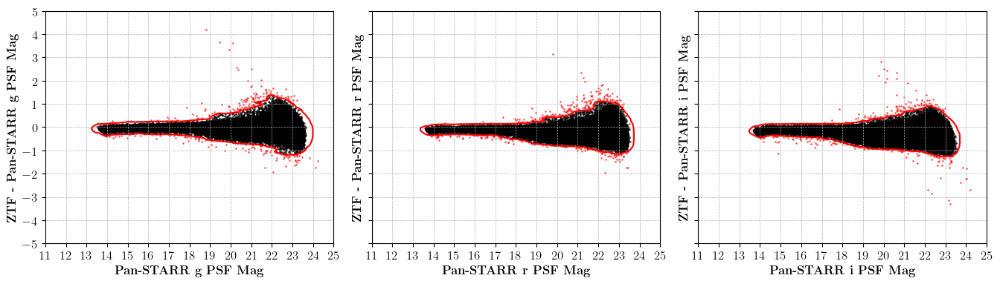

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

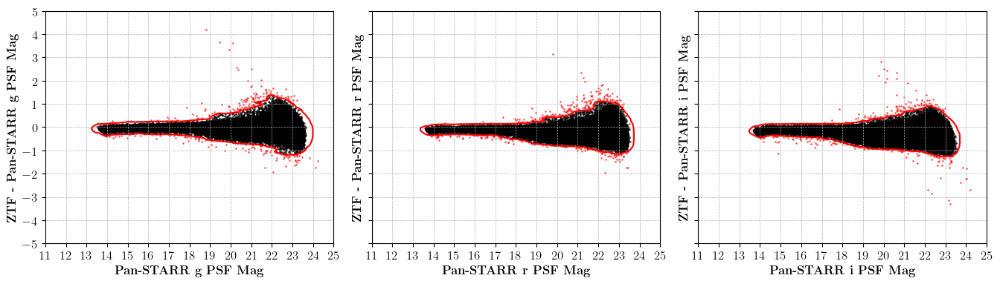

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

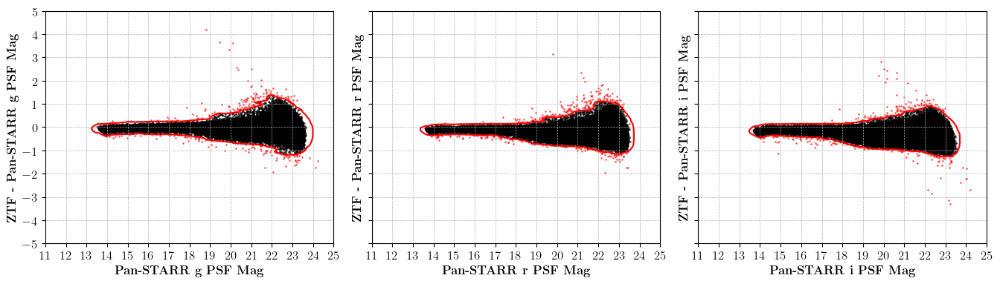

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

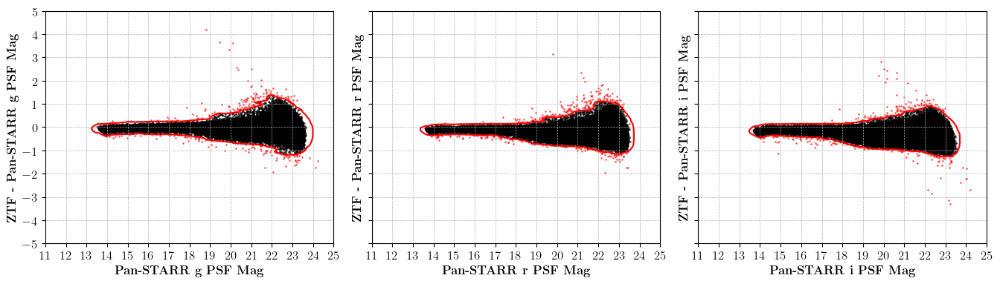

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

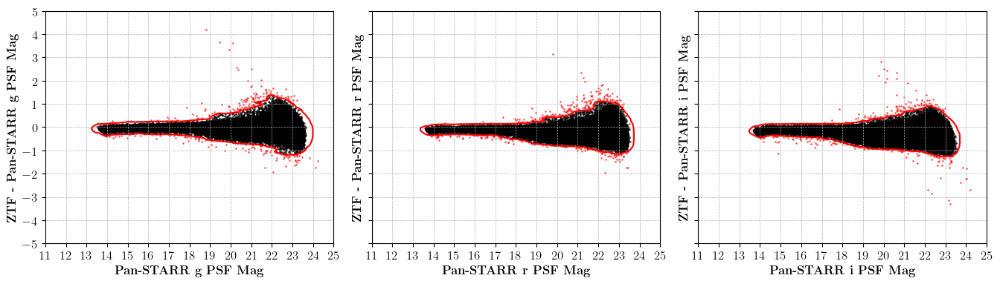

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

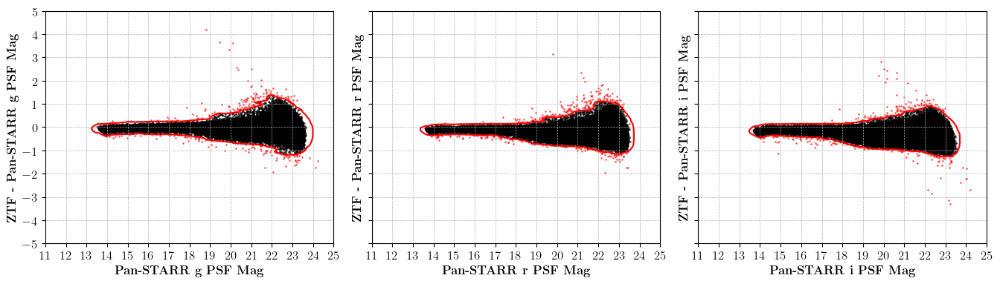

In [ ]:
# Plot
fig, axes = plt.subplots(1, 3, figsize=(13.6, 4), sharey=True)
for ax, band in zip(axes, ('g', 'r', 'i')):

    contour = ax.contour(X, Y, Zs[band], colors='red', levels=[0.0005])

    # Get points outside the contour
    path = contour.get_paths()[0]
    mask = path.contains_points(
        np.vstack((
            tables[band][f'PSTARR_{band}PSFMag'],
            tables[band][f'ZTF_{band}PSFMag'] - tables[band][f'PSTARR_{band}PSFMag'],
        )).T,
    )

    # Plot points
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][mask],
        tables[band][f'ZTF_{band}PSFMag'][mask] - tables[band][f'PSTARR_{band}PSFMag'][mask],
        s=1,
        color='k',
        alpha=0.5,
        zorder=-1,
    )
    ax.scatter(
        tables[band][f'PSTARR_{band}PSFMag'][~mask],
        tables[band][f'ZTF_{band}PSFMag'][~mask] - tables[band][f'PSTARR_{band}PSFMag'][~mask],
        s=1,
        color='red',
        alpha=0.5,
    )

    ax.set_ylabel(rf'\bf{{ZTF - Pan-STARR {band} PSF Mag}}')
    ax.set_xlabel(rf'\bf{{Pan-STARR {band} PSF Mag}}')
    ax.grid(lw=0.5, ls='--')

for ax in axes:
    ax.set_xticks(np.arange(np.floor(ax.get_xlim()[0]), np.ceil(ax.get_xlim()[1]) + 1, 1))
    ax.set_yticks(np.arange(np.floor(ax.get_ylim()[0]), np.ceil(ax.get_ylim()[1]) + 1, 1))

axes[-1].set_xlim((11, 25))
ax.set_ylim(-5, 5)

plt.tight_layout()

Extracting sources...
Calculating Kron magnitudes...


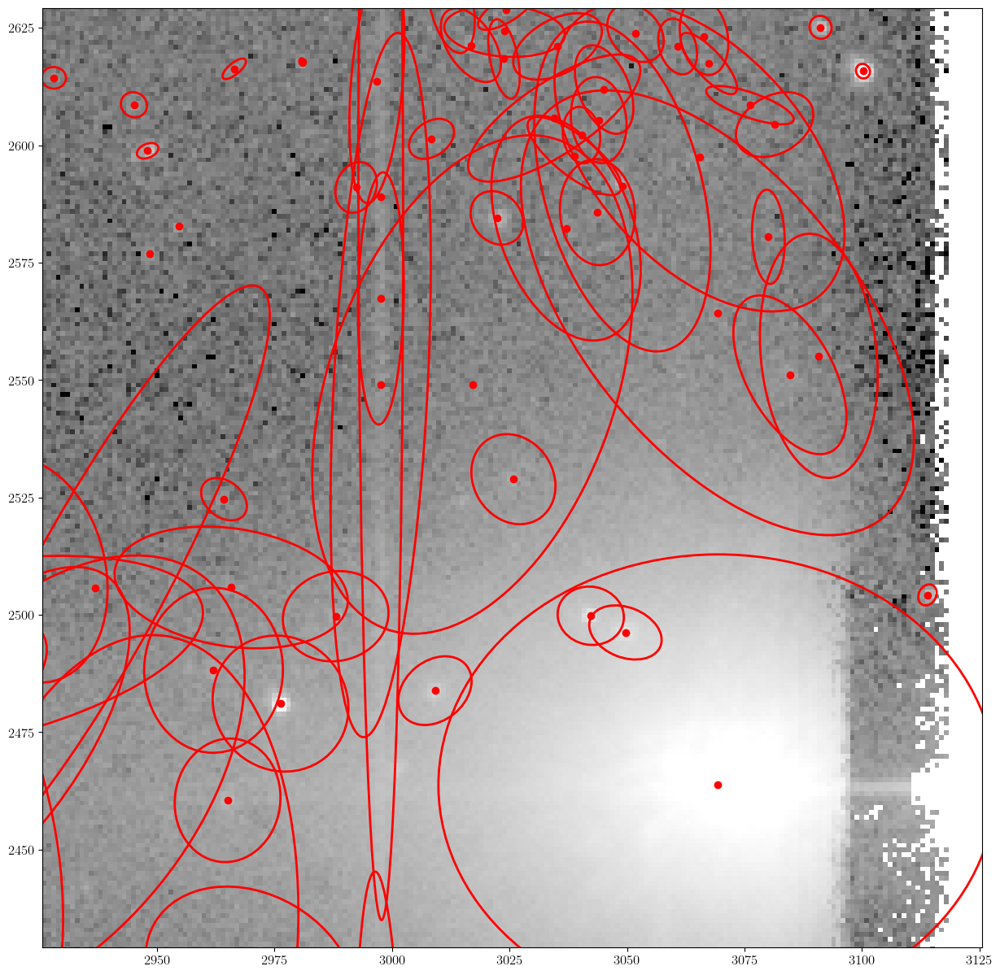

In [84]:
x, y = ztf_cat.sextractor.ra_dec_to_pix(srcs[8].ra, srcs[8].dec)
ztf_cat.sextractor.plot_segmap(show_source_shapes=True, image_is_subtracted=True)
plt.xlim(x - 100, x + 100)
plt.ylim(y - 100, y + 100)
plt.show()

<Axes: >

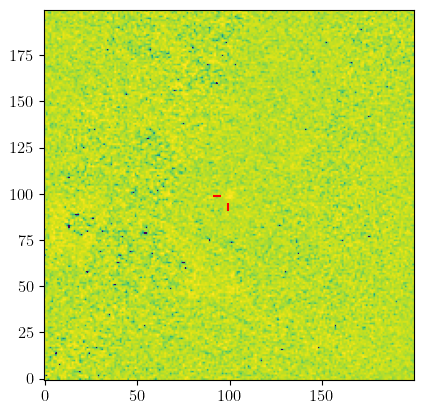

In [43]:
close_mask = (np.abs(srcs[8].ra - full_tab['ZTF_ra']) < 0.01) & (np.abs(srcs[8].dec - full_tab['ZTF_dec']) < 0.001)
srcs[8].postage_stamps['PSTARR'].plot_cutout(
    band='g',
    xs=full_tab['ZTF_ra'][close_mask],
    ys=full_tab['ZTF_dec'][close_mask],
)

In [24]:
from astropy.io import fits

fits_path = "/Users/adamboesky/Research/long_transients/Data/ztf_data/ztf_000202_zg_c16_q2_refimg.fits"
with fits.open(fits_path) as hdul:
    hdul.info()
    # Optionally, display header of primary HDU
hdul[0].header


Filename: /Users/adamboesky/Research/long_transients/Data/ztf_data/ztf_000202_zg_c16_q2_refimg.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      87   (3200, 3200)   float32   


SIMPLE  =                    T / This is a FITS file                            
BITPIX  =                  -32                                                  
NAXIS   =                    2                                                  
NAXIS1  =                 3200 / NUMBER OF ELEMENTS ALONG THIS AXIS             
NAXIS2  =                 3200 / NUMBER OF ELEMENTS ALONG THIS AXIS             
BUNIT   = 'DN'                 / units of pixel values                          
EXTEND  =                    T / This file may contain FITS extensions          
EQUINOX =   2.000000000000E+03 / Mean equinox                                   
RADESYS = 'ICRS    '           / Astrometric system                             
CTYPE1  = 'RA---TAN'           / WCS projection type for this axis              
CRVAL1  =   2.026061510000E+01 / World coordinate on this axis                  
CRPIX1  =   1.600500000000E+03 / Reference pixel on this axis                   
CD1_1   =   2.776588703490E-

In [ ]:
flags_quality = [1, 2, 128]
flags_objinfo = [8388608, 16777216, 536870912, 1073741824]

# Individual fractions for PSTARR_qualityFlag
for flag in flags_quality:
    mask = _is_flag(g_tab['PSTARR_qualityFlag'], flag)
    frac = np.sum(mask) / len(g_tab)
    print(f"Fraction with PSTARR_qualityFlag {flag}: {frac:.4f}")

# Individual fractions for PSTARR_objInfoFlag
for flag in flags_objinfo:
    mask = _is_flag(g_tab['PSTARR_objInfoFlag'], flag)
    frac = np.sum(mask) / len(g_tab)
    print(f"Fraction with PSTARR_objInfoFlag {flag}: {frac:.4f}")

# Combined mask (as in the original code)
combined_mask = np.logical_or(
    _is_flag(g_tab['PSTARR_qualityFlag'], flags_quality),
    _is_flag(g_tab['PSTARR_objInfoFlag'], flags_objinfo),
)
combined_frac = np.sum(combined_mask) / len(g_tab)
print(f"Fraction with any of the specified flags: {combined_frac:.4f}")


Fraction with PSTARR_qualityFlag 1: 0.2354
Fraction with PSTARR_qualityFlag 2: 0.0000
Fraction with PSTARR_qualityFlag 128: 0.3587
Fraction with PSTARR_objInfoFlag 8388608: 0.2354
Fraction with PSTARR_objInfoFlag 16777216: 0.0000
Fraction with PSTARR_objInfoFlag 536870912: 0.0016
Fraction with PSTARR_objInfoFlag 1073741824: 0.3587
Fraction with any of the specified flags: 0.5282


In [10]:
from Source_Analysis.filter_fields import _is_flag

In [12]:
for i in range(23):
    if _is_flag(np.array([52]), 2**i):
        print(2**i)

4
16
32


# ZTF Image Upper Lims

In [31]:
from astropy.io import fits
import os

In [35]:
ztf_dirpath = '/Users/adamboesky/Research/long_transients/Data/ztf_data'
upper_lims = [
    fits.open(os.path.join(ztf_dirpath, f))[0].header['MAGLIM'] for f in os.listdir(ztf_dirpath)
]

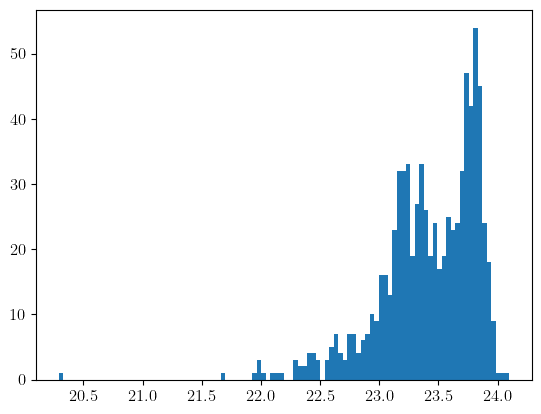

In [37]:
plt.hist(upper_lims, bins=100)
plt.show()